Following the audio data pipeline at https://towardsdatascience.com/how-to-build-efficient-audio-data-pipelines-with-tensorflow-2-0-b3133474c3c1

Tensorflow io exploration: https://www.tensorflow.org/io/tutorials/audio


In [1]:
import pandas as pd
import tensorflow as tf
from glob import glob

In [2]:
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [3]:
df = pd.read_csv('input/birdclef-2021/train_metadata.csv')
df.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,date,filename,license,rating,time,url
0,acafly,['amegfi'],"['begging call', 'call', 'juvenile']",35.3860,-84.1250,Empidonax virescens,Acadian Flycatcher,Mike Nelson,2012-08-12,XC109605.ogg,Creative Commons Attribution-NonCommercial-Sha...,2.5,09:30,https://www.xeno-canto.org/109605
1,acafly,[],['call'],9.1334,-79.6501,Empidonax virescens,Acadian Flycatcher,Allen T. Chartier,2000-12-26,XC11209.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.0,?,https://www.xeno-canto.org/11209
2,acafly,[],['call'],5.7813,-75.7452,Empidonax virescens,Acadian Flycatcher,Sergio Chaparro-Herrera,2012-01-10,XC127032.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.0,15:20,https://www.xeno-canto.org/127032
3,acafly,['whwbec1'],['call'],4.6717,-75.6283,Empidonax virescens,Acadian Flycatcher,Oscar Humberto Marin-Gomez,2009-06-19,XC129974.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.5,07:50,https://www.xeno-canto.org/129974
4,acafly,['whwbec1'],['call'],4.6717,-75.6283,Empidonax virescens,Acadian Flycatcher,Oscar Humberto Marin-Gomez,2009-06-19,XC129981.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.5,07:50,https://www.xeno-canto.org/129981


In [4]:
files = glob('input/birdclef-2021/train_short_audio/*/*.ogg')
files_tensor = tf.data.Dataset.list_files('input/birdclef-2021/train_short_audio/*/*.ogg', shuffle=False)
files_tensor

<TensorSliceDataset shapes: (), types: tf.string>

In [6]:
for filename in files[:5]:
    label = tf.strings.split(filename, sep='/')[-2]
    print(label)

tf.Tensor(b'acafly', shape=(), dtype=string)
tf.Tensor(b'acafly', shape=(), dtype=string)
tf.Tensor(b'acafly', shape=(), dtype=string)
tf.Tensor(b'acafly', shape=(), dtype=string)
tf.Tensor(b'acafly', shape=(), dtype=string)


In [7]:
def get_labels_from_path(filename):
    label = tf.strings.split(filename, sep='/')[-2]
    return filename, label
    
def get_dataset():
    file_paths = 'input/birdclef-2021/train_short_audio/*/*.ogg'
    file_paths_ds = tf.data.Dataset.list_files(file_paths, shuffle=False)
    ds = file_paths_ds.map(get_labels_from_path, num_parallel_calls=AUTOTUNE)
    
    return ds

In [8]:
def load_audio(file_path, label):
    audio = tf.io.read_file(file_path)
    audio = tf.audio.decode_vorbis(audio)
    return audio, label

In [9]:
ds = get_dataset()

In [21]:
ds

<ParallelMapDataset shapes: ((), ()), types: (tf.string, tf.string)>

In [10]:
for row in ds:
    print(row)

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/acafly/XC109605.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'acafly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/acafly/XC11209.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'acafly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/acafly/XC127032.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'acafly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/acafly/XC129974.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'acafly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/acafly/XC129981.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'acafly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/acafly/XC130056.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'acafly'>)
(<tf.Tensor: shape=(), dtype=string, nump

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/aldfly/XC604913.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'aldfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/aldfly/XC604914.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'aldfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/aldfly/XC604916.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'aldfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/aldfly/XC605054.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'aldfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/aldfly/XC611771.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'aldfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/aldfly/XC78890.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'aldfly'>)
(<tf.Tensor: shape=(), dtype=string, nump

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amecro/XC568365.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amecro'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amecro/XC569624.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amecro'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amecro/XC569711.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amecro'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amecro/XC574517.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amecro'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amecro/XC575220.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amecro'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amecro/XC577359.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amecro'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amepip/XC358830.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amepip'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amepip/XC358842.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amepip'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amepip/XC358862.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amepip'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amepip/XC382376.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amepip'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amepip/XC387537.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amepip'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amepip/XC406161.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amepip'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amerob/XC194079.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amerob'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amerob/XC201618.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amerob'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amerob/XC202135.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amerob'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amerob/XC203754.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amerob'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amerob/XC205803.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amerob'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/amerob/XC207801.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'amerob'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/andsol1/XC164.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'andsol1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/andsol1/XC167973.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'andsol1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/andsol1/XC167974.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'andsol1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/andsol1/XC180384.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'andsol1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/andsol1/XC180385.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'andsol1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/andsol1/XC183739.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'andsol1'>)
(<tf.Tensor: shape=(), dtype=st

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/astfly/XC348116.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'astfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/astfly/XC348123.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'astfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/astfly/XC348126.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'astfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/astfly/XC365936.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'astfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/astfly/XC367118.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'astfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/astfly/XC368291.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'astfly'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/balori/XC217802.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'balori'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/balori/XC217803.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'balori'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/balori/XC217804.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'balori'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/balori/XC217806.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'balori'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/balori/XC217808.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'balori'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/balori/XC217809.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'balori'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/banswa/XC372304.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'banswa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/banswa/XC372305.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'banswa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/banswa/XC375947.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'banswa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/banswa/XC375948.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'banswa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/banswa/XC377094.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'banswa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/banswa/XC378020.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'banswa'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/barswa/XC341167.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'barswa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/barswa/XC343867.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'barswa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/barswa/XC343870.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'barswa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/barswa/XC343873.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'barswa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/barswa/XC344095.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'barswa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/barswa/XC349298.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'barswa'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bawswa1/XC242902.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bawswa1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bawswa1/XC245029.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bawswa1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bawswa1/XC245165.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bawswa1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bawswa1/XC245166.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bawswa1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bawswa1/XC2502.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bawswa1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bawswa1/XC251252.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bawswa1'>)
(<tf.Tensor: shape=(), dtype=s

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/baywre1/XC355323.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'baywre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/baywre1/XC355324.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'baywre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/baywre1/XC355325.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'baywre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/baywre1/XC355327.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'baywre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/baywre1/XC355328.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'baywre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/baywre1/XC355329.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'baywre1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bcnher/XC363318.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bcnher'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bcnher/XC365511.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bcnher'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bcnher/XC370847.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bcnher'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bcnher/XC371129.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bcnher'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bcnher/XC373688.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bcnher'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bcnher/XC376311.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bcnher'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bcnher/XC85246.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bcnher'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bcnher/XC85247.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bcnher'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bcnher/XC99573.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bcnher'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/belkin1/XC116054.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'belkin1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/belkin1/XC116055.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'belkin1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/belkin1/XC116056.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'belkin1'>)
(<tf.Tensor: shape=(), dtype=string, 

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/belvir/XC31020.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'belvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/belvir/XC312742.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'belvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/belvir/XC312744.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'belvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/belvir/XC314128.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'belvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/belvir/XC320054.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'belvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/belvir/XC320055.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'belvir'>)
(<tf.Tensor: shape=(), dtype=string, nump

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bewwre/XC537732.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bewwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bewwre/XC537998.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bewwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bewwre/XC539015.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bewwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bewwre/XC539746.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bewwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bewwre/XC539931.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bewwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bewwre/XC542224.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bewwre'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bkcchi/XC277216.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bkcchi'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bkcchi/XC278350.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bkcchi'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bkcchi/XC282094.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bkcchi'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bkcchi/XC284487.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bkcchi'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bkcchi/XC284489.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bkcchi'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bkcchi/XC284495.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bkcchi'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bkmtou1/XC286424.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bkmtou1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bkmtou1/XC293695.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bkmtou1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bkmtou1/XC293747.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bkmtou1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bkmtou1/XC309494.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bkmtou1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bkmtou1/XC309505.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bkmtou1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bkmtou1/XC312738.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bkmtou1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blbthr1/XC474404.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blbthr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blbthr1/XC474406.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blbthr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blbthr1/XC474410.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blbthr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blbthr1/XC483052.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blbthr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blbthr1/XC498044.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blbthr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blbthr1/XC529280.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blbthr1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blugrb1/XC217046.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blugrb1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blugrb1/XC217981.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blugrb1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blugrb1/XC217982.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blugrb1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blugrb1/XC217983.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blugrb1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blugrb1/XC245874.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blugrb1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blugrb1/XC246200.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blugrb1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blujay/XC581341.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blujay'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blujay/XC585129.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blujay'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blujay/XC586549.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blujay'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blujay/XC587334.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blujay'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blujay/XC587488.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blujay'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/blujay/XC588404.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'blujay'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bnhcow/XC234785.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bnhcow'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bnhcow/XC235247.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bnhcow'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bnhcow/XC235427.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bnhcow'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bnhcow/XC253389.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bnhcow'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bnhcow/XC255700.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bnhcow'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bnhcow/XC255914.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bnhcow'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brbsol1/XC125647.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brbsol1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brbsol1/XC125648.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brbsol1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brbsol1/XC125649.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brbsol1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brbsol1/XC125650.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brbsol1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brbsol1/XC125651.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brbsol1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brbsol1/XC135312.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brbsol1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brncre/XC497492.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brncre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brncre/XC497494.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brncre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brncre/XC497497.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brncre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brncre/XC501259.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brncre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brncre/XC501260.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brncre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brncre/XC511292.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brncre'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brwhaw/XC575078.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brwhaw'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brwhaw/XC585448.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brwhaw'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brwhaw/XC585449.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brwhaw'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brwhaw/XC8883.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brwhaw'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brwpar1/XC127031.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brwpar1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/brwpar1/XC128404.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'brwpar1'>)
(<tf.Tensor: shape=(), dtype=string, n

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/buggna/XC315747.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'buggna'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/buggna/XC315780.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'buggna'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/buggna/XC316436.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'buggna'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/buggna/XC317245.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'buggna'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/buggna/XC323186.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'buggna'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/buggna/XC325273.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'buggna'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bulori/XC256851.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bulori'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bulori/XC256852.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bulori'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bulori/XC256853.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bulori'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bulori/XC256889.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bulori'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bulori/XC256893.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bulori'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bulori/XC256895.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bulori'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bulori/XC482281.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bulori'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bulori/XC483552.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bulori'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bulori/XC492404.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bulori'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bulori/XC499307.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bulori'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bulori/XC499308.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bulori'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bulori/XC535655.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bulori'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bushti/XC530309.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bushti'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bushti/XC530310.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bushti'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bushti/XC530311.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bushti'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bushti/XC530312.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bushti'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bushti/XC530313.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bushti'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/bushti/XC530314.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'bushti'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cacwre/XC466430.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cacwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cacwre/XC469890.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cacwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cacwre/XC475569.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cacwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cacwre/XC488232.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cacwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cacwre/XC488233.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cacwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cacwre/XC488451.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cacwre'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cangoo/XC557197.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cangoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cangoo/XC558239.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cangoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cangoo/XC559271.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cangoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cangoo/XC564549.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cangoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cangoo/XC565869.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cangoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cangoo/XC575174.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cangoo'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/carwre/XC140967.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'carwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/carwre/XC141029.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'carwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/carwre/XC141031.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'carwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/carwre/XC141267.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'carwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/carwre/XC141281.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'carwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/carwre/XC141460.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'carwre'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/caskin/XC124109.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'caskin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/caskin/XC124110.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'caskin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/caskin/XC124111.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'caskin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/caskin/XC124114.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'caskin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/caskin/XC124115.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'caskin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/caskin/XC124116.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'caskin'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/categr/XC451817.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'categr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/categr/XC452088.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'categr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/categr/XC452565.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'categr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/categr/XC453176.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'categr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/categr/XC458426.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'categr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/categr/XC463749.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'categr'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chbant1/XC335207.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chbant1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chbant1/XC335208.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chbant1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chbant1/XC335209.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chbant1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chbant1/XC335752.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chbant1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chbant1/XC338629.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chbant1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chbant1/XC353927.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chbant1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chcant2/XC202060.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chcant2'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chcant2/XC202803.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chcant2'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chcant2/XC204360.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chcant2'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chcant2/XC210285.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chcant2'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chcant2/XC211072.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chcant2'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chcant2/XC211074.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chcant2'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chispa/XC313466.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chispa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chispa/XC313467.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chispa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chispa/XC313468.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chispa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chispa/XC313469.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chispa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chispa/XC313880.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chispa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/chispa/XC314922.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'chispa'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/clanut/XC428224.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'clanut'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/clanut/XC433232.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'clanut'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/clanut/XC433233.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'clanut'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/clanut/XC442217.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'clanut'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/clanut/XC448739.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'clanut'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/clanut/XC448740.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'clanut'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cobtan1/XC586429.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cobtan1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cobtan1/XC586430.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cobtan1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cobtan1/XC607786.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cobtan1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cobtan1/XC607789.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cobtan1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cobtan1/XC607791.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cobtan1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cobtan1/XC607794.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cobtan1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comgol/XC502178.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comgol'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comgol/XC503380.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comgol'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comgol/XC504527.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comgol'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comgol/XC504892.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comgol'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comgol/XC507254.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comgol'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comgol/XC518957.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comgol'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/compau/XC174705.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'compau'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/compau/XC180489.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'compau'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/compau/XC186383.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'compau'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/compau/XC186384.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'compau'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/compau/XC186385.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'compau'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/compau/XC188551.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'compau'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comrav/XC115767.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comrav'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comrav/XC116979.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comrav'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comrav/XC116983.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comrav'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comrav/XC119597.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comrav'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comrav/XC121414.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comrav'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comrav/XC122382.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comrav'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comrav/XC552798.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comrav'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comrav/XC560491.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comrav'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comrav/XC560493.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comrav'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comrav/XC561383.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comrav'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comrav/XC561384.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comrav'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/comrav/XC561488.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'comrav'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/coohaw/XC341016.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'coohaw'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/coohaw/XC341967.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'coohaw'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/coohaw/XC360233.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'coohaw'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/coohaw/XC369837.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'coohaw'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/coohaw/XC384903.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'coohaw'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/coohaw/XC388034.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'coohaw'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/creoro1/XC212837.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'creoro1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/creoro1/XC212838.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'creoro1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/creoro1/XC212839.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'creoro1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/creoro1/XC213316.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'creoro1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/creoro1/XC2198.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'creoro1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/creoro1/XC234315.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'creoro1'>)
(<tf.Tensor: shape=(), dtype=s

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cubthr/XC612138.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cubthr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cubthr/XC612139.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cubthr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cubthr/XC612140.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cubthr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cubthr/XC612141.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cubthr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cubthr/XC612142.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cubthr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/cubthr/XC612145.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'cubthr'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/dowwoo/XC500162.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'dowwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/dowwoo/XC500163.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'dowwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/dowwoo/XC523512.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'dowwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/dowwoo/XC52422.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'dowwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/dowwoo/XC52423.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'dowwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/dowwoo/XC52424.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'dowwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/dusfly/XC293660.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'dusfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/dusfly/XC299622.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'dusfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/dusfly/XC302407.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'dusfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/dusfly/XC306672.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'dusfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/dusfly/XC314041.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'dusfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/dusfly/XC314045.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'dusfly'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/easmea/XC577114.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'easmea'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/easmea/XC579051.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'easmea'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/easmea/XC589390.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'easmea'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/easmea/XC601015.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'easmea'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/easmea/XC605847.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'easmea'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/easmea/XC607429.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'easmea'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eastow/XC583502.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eastow'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eastow/XC599326.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eastow'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eastow/XC601021.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eastow'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eastow/XC601022.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eastow'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eastow/XC601023.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eastow'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eastow/XC605344.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eastow'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eucdov/XC322661.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eucdov'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eucdov/XC322745.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eucdov'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eucdov/XC324006.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eucdov'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eucdov/XC324031.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eucdov'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eucdov/XC328462.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eucdov'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eucdov/XC337620.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eucdov'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eursta/XC372506.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eursta'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eursta/XC374194.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eursta'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eursta/XC374395.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eursta'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eursta/XC374704.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eursta'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eursta/XC374761.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eursta'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/eursta/XC374762.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'eursta'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/fiespa/XC167935.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'fiespa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/fiespa/XC16929.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'fiespa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/fiespa/XC16986.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'fiespa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/fiespa/XC179707.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'fiespa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/fiespa/XC181786.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'fiespa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/fiespa/XC188277.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'fiespa'>)
(<tf.Tensor: shape=(), dtype=string, numpy

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gamqua/XC54720.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gamqua'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gamqua/XC54721.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gamqua'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gamqua/XC548856.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gamqua'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gamqua/XC548857.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gamqua'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gamqua/XC555053.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gamqua'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gamqua/XC565518.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gamqua'>)
(<tf.Tensor: shape=(), dtype=string, numpy

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gbwwre1/XC127192.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gbwwre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gbwwre1/XC127271.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gbwwre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gbwwre1/XC127801.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gbwwre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gbwwre1/XC127802.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gbwwre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gbwwre1/XC128188.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gbwwre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gbwwre1/XC128593.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gbwwre1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gbwwre1/XC235836.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gbwwre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gbwwre1/XC235837.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gbwwre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gbwwre1/XC237861.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gbwwre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gbwwre1/XC237863.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gbwwre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gbwwre1/XC237902.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gbwwre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gbwwre1/XC240111.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gbwwre1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gcrwar/XC551571.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gcrwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gcrwar/XC551573.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gcrwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gcrwar/XC556169.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gcrwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gcrwar/XC556170.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gcrwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gcrwar/XC558870.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gcrwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gcrwar/XC562053.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gcrwar'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gnwtea/XC432032.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gnwtea'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gnwtea/XC432033.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gnwtea'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gnwtea/XC432034.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gnwtea'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gnwtea/XC432035.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gnwtea'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gnwtea/XC432193.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gnwtea'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gnwtea/XC432260.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gnwtea'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gockin/XC490938.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gockin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gockin/XC490939.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gockin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gockin/XC500965.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gockin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gockin/XC501254.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gockin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gockin/XC501255.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gockin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/gockin/XC501256.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'gockin'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grasal1/XC317807.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grasal1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grasal1/XC317808.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grasal1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grasal1/XC320009.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grasal1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grasal1/XC321867.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grasal1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grasal1/XC32399.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grasal1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grasal1/XC325559.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grasal1'>)
(<tf.Tensor: shape=(), dtype=

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grcfly/XC570046.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grcfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grcfly/XC570599.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grcfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grcfly/XC573420.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grcfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grcfly/XC578069.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grcfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grcfly/XC578521.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grcfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grcfly/XC578522.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grcfly'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grepew/XC265363.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grepew'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grepew/XC283529.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grepew'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grepew/XC283530.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grepew'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grepew/XC283533.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grepew'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grepew/XC288042.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grepew'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grepew/XC291009.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grepew'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/greyel/XC552386.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'greyel'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/greyel/XC56910.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'greyel'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/greyel/XC584815.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'greyel'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/greyel/XC589662.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'greyel'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/greyel/XC606570.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'greyel'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/greyel/XC606571.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'greyel'>)
(<tf.Tensor: shape=(), dtype=string, nump

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grtgra/XC370719.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grtgra'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grtgra/XC376266.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grtgra'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grtgra/XC376444.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grtgra'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grtgra/XC376445.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grtgra'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grtgra/XC376446.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grtgra'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grtgra/XC383350.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grtgra'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grycat/XC218811.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grycat'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grycat/XC218812.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grycat'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grycat/XC218813.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grycat'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grycat/XC218814.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grycat'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grycat/XC218815.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grycat'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/grycat/XC241123.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'grycat'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/haiwoo/XC135779.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'haiwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/haiwoo/XC135780.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'haiwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/haiwoo/XC137049.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'haiwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/haiwoo/XC137050.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'haiwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/haiwoo/XC137051.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'haiwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/haiwoo/XC137052.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'haiwoo'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/herthr/XC441125.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'herthr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/herthr/XC443195.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'herthr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/herthr/XC443197.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'herthr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/herthr/XC444652.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'herthr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/herthr/XC444956.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'herthr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/herthr/XC446628.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'herthr'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/houspa/XC260081.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'houspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/houspa/XC260082.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'houspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/houspa/XC264024.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'houspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/houspa/XC264941.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'houspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/houspa/XC268245.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'houspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/houspa/XC268690.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'houspa'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/houwre/XC236222.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'houwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/houwre/XC243192.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'houwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/houwre/XC243193.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'houwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/houwre/XC244194.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'houwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/houwre/XC245168.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'houwre'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/houwre/XC245662.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'houwre'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/incdov/XC166278.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'incdov'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/incdov/XC167720.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'incdov'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/incdov/XC181091.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'incdov'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/incdov/XC185165.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'incdov'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/incdov/XC198391.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'incdov'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/incdov/XC202751.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'incdov'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/labwoo/XC451309.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'labwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/labwoo/XC452353.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'labwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/labwoo/XC452494.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'labwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/labwoo/XC452764.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'labwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/labwoo/XC453236.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'labwoo'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/labwoo/XC455590.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'labwoo'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lazbun/XC415453.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lazbun'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lazbun/XC419780.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lazbun'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lazbun/XC420459.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lazbun'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lazbun/XC421763.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lazbun'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lazbun/XC442207.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lazbun'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lazbun/XC442209.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lazbun'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lesgol/XC531582.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lesgol'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lesgol/XC531583.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lesgol'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lesgol/XC531584.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lesgol'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lesgol/XC539957.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lesgol'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lesgol/XC540320.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lesgol'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lesgol/XC541913.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lesgol'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lesvio1/XC130116.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lesvio1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lesvio1/XC130141.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lesvio1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lesvio1/XC144641.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lesvio1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lesvio1/XC145485.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lesvio1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lesvio1/XC145486.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lesvio1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lesvio1/XC145487.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lesvio1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/linwoo1/XC443232.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'linwoo1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/linwoo1/XC446765.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'linwoo1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/linwoo1/XC451310.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'linwoo1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/linwoo1/XC451311.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'linwoo1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/linwoo1/XC451312.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'linwoo1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/linwoo1/XC451313.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'linwoo1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/littin1/XC427268.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'littin1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/littin1/XC427269.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'littin1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/littin1/XC429331.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'littin1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/littin1/XC439207.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'littin1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/littin1/XC455138.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'littin1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/littin1/XC461383.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'littin1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lobgna5/XC595102.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lobgna5'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lobgna5/XC597721.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lobgna5'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lobgna5/XC608432.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lobgna5'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lobgna5/XC609155.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lobgna5'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lobgna5/XC611376.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lobgna5'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lobgna5/XC612781.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lobgna5'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lotman1/XC332571.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lotman1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lotman1/XC332572.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lotman1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lotman1/XC332573.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lotman1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lotman1/XC334558.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lotman1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lotman1/XC334561.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lotman1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/lotman1/XC334564.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'lotman1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/macwar/XC612058.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'macwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/magwar/XC101612.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'magwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/magwar/XC111148.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'magwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/magwar/XC111149.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'magwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/magwar/XC134167.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'magwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/magwar/XC134300.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'magwar'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/magwar/XC380134.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'magwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/magwar/XC380135.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'magwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/magwar/XC382124.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'magwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/magwar/XC382125.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'magwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/magwar/XC389099.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'magwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/magwar/XC389101.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'magwar'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mallar3/XC522286.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mallar3'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mallar3/XC522605.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mallar3'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mallar3/XC522622.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mallar3'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mallar3/XC522742.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mallar3'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mallar3/XC522743.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mallar3'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mallar3/XC523626.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mallar3'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mastro1/XC147988.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mastro1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mastro1/XC149226.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mastro1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mastro1/XC1603.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mastro1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mastro1/XC182577.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mastro1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mastro1/XC186597.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mastro1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mastro1/XC186598.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mastro1'>)
(<tf.Tensor: shape=(), dtype=s

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mouchi/XC381390.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mouchi'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mouchi/XC390193.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mouchi'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mouchi/XC390195.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mouchi'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mouchi/XC395088.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mouchi'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mouchi/XC397595.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mouchi'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mouchi/XC399844.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mouchi'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mutswa/XC534054.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mutswa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mutswa/XC534077.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mutswa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mutswa/XC536633.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mutswa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mutswa/XC543410.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mutswa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mutswa/XC544942.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mutswa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/mutswa/XC549714.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'mutswa'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/norcar/XC527915.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'norcar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/norcar/XC531775.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'norcar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/norcar/XC534172.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'norcar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/norcar/XC534176.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'norcar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/norcar/XC534462.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'norcar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/norcar/XC534465.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'norcar'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/normoc/XC490227.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'normoc'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/normoc/XC490762.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'normoc'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/normoc/XC492305.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'normoc'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/normoc/XC493654.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'normoc'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/normoc/XC493656.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'normoc'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/normoc/XC494107.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'normoc'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/norwat/XC450990.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'norwat'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/norwat/XC451025.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'norwat'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/norwat/XC455034.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'norwat'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/norwat/XC455489.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'norwat'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/norwat/XC455652.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'norwat'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/norwat/XC457129.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'norwat'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/obnthr1/XC352806.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'obnthr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/obnthr1/XC358834.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'obnthr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/obnthr1/XC367125.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'obnthr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/obnthr1/XC370921.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'obnthr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/obnthr1/XC372326.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'obnthr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/obnthr1/XC372820.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'obnthr1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/oliwoo1/XC516216.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'oliwoo1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/oliwoo1/XC518145.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'oliwoo1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/oliwoo1/XC520324.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'oliwoo1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/oliwoo1/XC520353.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'oliwoo1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/oliwoo1/XC520356.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'oliwoo1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/oliwoo1/XC521973.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'oliwoo1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/orbspa1/XC424478.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'orbspa1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/orbspa1/XC425563.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'orbspa1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/orbspa1/XC428651.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'orbspa1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/orbspa1/XC428652.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'orbspa1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/orbspa1/XC428692.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'orbspa1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/orbspa1/XC429149.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'orbspa1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ovenbi1/XC137909.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ovenbi1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ovenbi1/XC138059.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ovenbi1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ovenbi1/XC139445.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ovenbi1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ovenbi1/XC139878.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ovenbi1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ovenbi1/XC140260.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ovenbi1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ovenbi1/XC140676.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ovenbi1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/pasfly/XC195031.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'pasfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/pasfly/XC195273.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'pasfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/pasfly/XC234332.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'pasfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/pasfly/XC246646.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'pasfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/pasfly/XC288020.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'pasfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/pasfly/XC291403.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'pasfly'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/pinsis/XC227323.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'pinsis'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/pinsis/XC227327.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'pinsis'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/pinsis/XC227350.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'pinsis'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/pinsis/XC227370.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'pinsis'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/pinsis/XC227385.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'pinsis'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/pinsis/XC227404.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'pinsis'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/plawre1/XC391883.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'plawre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/plawre1/XC403331.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'plawre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/plawre1/XC436483.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'plawre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/plawre1/XC453793.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'plawre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/plawre1/XC486148.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'plawre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/plawre1/XC488754.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'plawre1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/plsvir/XC483015.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'plsvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/plsvir/XC483988.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'plsvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/plsvir/XC485479.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'plsvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/plsvir/XC492790.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'plsvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/plsvir/XC494215.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'plsvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/plsvir/XC495222.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'plsvir'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/purfin/XC614293.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'purfin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/purfin/XC70686.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'purfin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/purfin/XC70945.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'purfin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/purfin/XC70946.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'purfin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/purfin/XC70947.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'purfin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/purfin/XC70948.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'purfin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rebnut/XC253550.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rebnut'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rebnut/XC253553.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rebnut'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rebnut/XC253588.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rebnut'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rebnut/XC253712.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rebnut'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rebnut/XC255168.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rebnut'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rebnut/XC256093.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rebnut'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/redcro/XC251980.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'redcro'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/redcro/XC251985.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'redcro'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/redcro/XC252194.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'redcro'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/redcro/XC253336.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'redcro'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/redcro/XC253527.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'redcro'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/redcro/XC253530.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'redcro'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rehbar1/XC10699.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rehbar1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rehbar1/XC120125.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rehbar1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rehbar1/XC127949.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rehbar1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rehbar1/XC128996.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rehbar1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rehbar1/XC130055.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rehbar1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rehbar1/XC164511.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rehbar1'>)
(<tf.Tensor: shape=(), dtype=

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rewbla/XC311955.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rewbla'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rewbla/XC311956.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rewbla'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rewbla/XC312600.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rewbla'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rewbla/XC313077.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rewbla'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rewbla/XC313152.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rewbla'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rewbla/XC313157.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rewbla'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/roahaw/XC121461.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'roahaw'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/roahaw/XC122235.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'roahaw'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/roahaw/XC126074.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'roahaw'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/roahaw/XC127122.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'roahaw'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/roahaw/XC128461.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'roahaw'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/roahaw/XC129390.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'roahaw'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rotbec/XC439833.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rotbec'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rotbec/XC439834.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rotbec'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rotbec/XC439835.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rotbec'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rotbec/XC439836.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rotbec'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rotbec/XC439837.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rotbec'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rotbec/XC439838.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rotbec'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ruboro1/XC386733.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ruboro1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ruboro1/XC389892.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ruboro1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ruboro1/XC406602.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ruboro1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ruboro1/XC423366.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ruboro1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ruboro1/XC423370.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ruboro1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ruboro1/XC431672.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ruboro1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rubpep1/XC197653.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rubpep1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rubpep1/XC198387.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rubpep1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rubpep1/XC19955.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rubpep1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rubpep1/XC204962.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rubpep1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rubpep1/XC206144.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rubpep1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rubpep1/XC207201.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rubpep1'>)
(<tf.Tensor: shape=(), dtype=

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rubpep1/XC576268.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rubpep1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rubpep1/XC578753.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rubpep1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rubpep1/XC581262.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rubpep1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rubpep1/XC584550.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rubpep1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rubpep1/XC591280.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rubpep1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rubpep1/XC599430.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rubpep1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ruckin/XC389095.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ruckin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ruckin/XC389431.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ruckin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ruckin/XC389970.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ruckin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ruckin/XC389971.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ruckin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ruckin/XC394365.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ruckin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/ruckin/XC408231.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'ruckin'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rucspa1/XC529589.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rucspa1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rucspa1/XC529590.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rucspa1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rucspa1/XC529638.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rucspa1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rucspa1/XC529672.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rucspa1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rucspa1/XC529673.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rucspa1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rucspa1/XC529674.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rucspa1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rudtur/XC503609.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rudtur'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rudtur/XC505075.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rudtur'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rudtur/XC507205.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rudtur'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rudtur/XC507681.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rudtur'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rudtur/XC518526.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rudtur'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/rudtur/XC526255.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'rudtur'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/saffin/XC561357.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'saffin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/saffin/XC561361.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'saffin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/saffin/XC562695.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'saffin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/saffin/XC562696.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'saffin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/saffin/XC562697.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'saffin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/saffin/XC572940.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'saffin'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/scamac1/XC153968.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'scamac1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/scamac1/XC156311.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'scamac1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/scamac1/XC167703.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'scamac1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/scamac1/XC1888.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'scamac1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/scamac1/XC208959.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'scamac1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/scamac1/XC213006.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'scamac1'>)
(<tf.Tensor: shape=(), dtype=s

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/scptyr1/XC379514.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'scptyr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/scptyr1/XC379515.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'scptyr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/scptyr1/XC379570.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'scptyr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/scptyr1/XC390714.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'scptyr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/scptyr1/XC390719.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'scptyr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/scptyr1/XC406005.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'scptyr1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sinwre1/XC513116.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sinwre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sinwre1/XC513125.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sinwre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sinwre1/XC513126.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sinwre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sinwre1/XC513127.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sinwre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sinwre1/XC514069.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sinwre1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sinwre1/XC65642.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sinwre1'>)
(<tf.Tensor: shape=(), dtype=

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sobtyr1/XC212875.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sobtyr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sobtyr1/XC213747.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sobtyr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sobtyr1/XC214765.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sobtyr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sobtyr1/XC215523.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sobtyr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sobtyr1/XC218731.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sobtyr1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sobtyr1/XC2328.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sobtyr1'>)
(<tf.Tensor: shape=(), dtype=s

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/socfly1/XC599774.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'socfly1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/socfly1/XC600294.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'socfly1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/socfly1/XC606544.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'socfly1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/socfly1/XC606610.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'socfly1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/socfly1/XC609877.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'socfly1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/socfly1/XC611124.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'socfly1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sonspa/XC155236.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sonspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sonspa/XC155237.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sonspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sonspa/XC156283.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sonspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sonspa/XC157591.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sonspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sonspa/XC163211.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sonspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sonspa/XC163634.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sonspa'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sonspa/XC393854.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sonspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sonspa/XC393994.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sonspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sonspa/XC393996.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sonspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sonspa/XC394309.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sonspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sonspa/XC394760.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sonspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sonspa/XC399259.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sonspa'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sposan/XC154789.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sposan'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sposan/XC157635.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sposan'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sposan/XC157671.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sposan'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sposan/XC183591.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sposan'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sposan/XC183594.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sposan'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sposan/XC183595.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sposan'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/spotow/XC539961.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'spotow'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/spotow/XC540007.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'spotow'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/spotow/XC540013.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'spotow'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/spotow/XC540262.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'spotow'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/spotow/XC540263.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'spotow'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/spotow/XC540267.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'spotow'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/squcuc1/XC118588.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'squcuc1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/squcuc1/XC118878.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'squcuc1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/squcuc1/XC119298.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'squcuc1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/squcuc1/XC120149.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'squcuc1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/squcuc1/XC120161.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'squcuc1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/squcuc1/XC120688.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'squcuc1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/squcuc1/XC411742.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'squcuc1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/squcuc1/XC418645.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'squcuc1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/squcuc1/XC419554.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'squcuc1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/squcuc1/XC422162.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'squcuc1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/squcuc1/XC425724.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'squcuc1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/squcuc1/XC429381.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'squcuc1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/stejay/XC288457.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'stejay'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/stejay/XC288627.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'stejay'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/stejay/XC292470.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'stejay'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/stejay/XC293739.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'stejay'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/stejay/XC293740.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'stejay'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/stejay/XC293741.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'stejay'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/strcuc1/XC291921.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'strcuc1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/strcuc1/XC294725.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'strcuc1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/strcuc1/XC297344.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'strcuc1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/strcuc1/XC313548.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'strcuc1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/strcuc1/XC315727.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'strcuc1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/strcuc1/XC325564.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'strcuc1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/strfly1/XC421436.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'strfly1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/strfly1/XC424489.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'strfly1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/strfly1/XC424720.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'strfly1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/strfly1/XC427614.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'strfly1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/strfly1/XC443341.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'strfly1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/strfly1/XC443364.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'strfly1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sumtan/XC129294.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sumtan'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sumtan/XC130162.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sumtan'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sumtan/XC131745.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sumtan'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sumtan/XC132058.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sumtan'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sumtan/XC133991.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sumtan'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/sumtan/XC135046.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'sumtan'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/swathr/XC130123.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'swathr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/swathr/XC134550.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'swathr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/swathr/XC134551.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'swathr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/swathr/XC134606.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'swathr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/swathr/XC134988.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'swathr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/swathr/XC139499.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'swathr'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/swathr/XC293880.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'swathr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/swathr/XC293881.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'swathr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/swathr/XC294258.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'swathr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/swathr/XC298671.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'swathr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/swathr/XC299114.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'swathr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/swathr/XC302419.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'swathr'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tenwar/XC377617.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tenwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tenwar/XC377618.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tenwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tenwar/XC379123.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tenwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tenwar/XC381059.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tenwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tenwar/XC381154.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tenwar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tenwar/XC383964.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tenwar'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/thbkin/XC316320.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'thbkin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/thbkin/XC316328.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'thbkin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/thbkin/XC321803.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'thbkin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/thbkin/XC321805.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'thbkin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/thbkin/XC321806.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'thbkin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/thbkin/XC321809.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'thbkin'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/towsol/XC461638.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'towsol'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/towsol/XC467488.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'towsol'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/towsol/XC488461.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'towsol'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/towsol/XC489372.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'towsol'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/towsol/XC511313.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'towsol'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/towsol/XC512411.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'towsol'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/trokin/XC167035.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'trokin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/trokin/XC170065.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'trokin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/trokin/XC17219.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'trokin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/trokin/XC174821.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'trokin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/trokin/XC176857.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'trokin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/trokin/XC1773.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'trokin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tromoc/XC579872.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tromoc'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tromoc/XC579873.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tromoc'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tromoc/XC580905.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tromoc'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tromoc/XC582727.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tromoc'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tromoc/XC583075.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tromoc'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tromoc/XC597465.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tromoc'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tuftit/XC568906.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tuftit'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tuftit/XC569728.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tuftit'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tuftit/XC572375.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tuftit'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tuftit/XC572390.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tuftit'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tuftit/XC575273.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tuftit'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/tuftit/XC581501.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'tuftit'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/verdin/XC297498.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'verdin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/verdin/XC302292.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'verdin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/verdin/XC302302.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'verdin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/verdin/XC304429.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'verdin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/verdin/XC305266.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'verdin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/verdin/XC316865.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'verdin'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/warvir/XC192520.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'warvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/warvir/XC192521.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'warvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/warvir/XC192522.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'warvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/warvir/XC192830.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'warvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/warvir/XC193152.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'warvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/warvir/XC193224.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'warvir'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/warvir/XC479439.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'warvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/warvir/XC479797.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'warvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/warvir/XC480679.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'warvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/warvir/XC481119.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'warvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/warvir/XC481120.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'warvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/warvir/XC482172.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'warvir'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/webwoo1/XC261964.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'webwoo1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/webwoo1/XC261965.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'webwoo1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/webwoo1/XC261966.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'webwoo1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/webwoo1/XC261967.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'webwoo1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/webwoo1/XC275357.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'webwoo1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/webwoo1/XC275358.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'webwoo1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/weskin/XC540830.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'weskin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/weskin/XC551059.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'weskin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/weskin/XC552239.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'weskin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/weskin/XC570382.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'weskin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/weskin/XC591675.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'weskin'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/weskin/XC598102.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'weskin'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wewpew/XC124519.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wewpew'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wewpew/XC124521.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wewpew'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wewpew/XC124522.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wewpew'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wewpew/XC124523.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wewpew'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wewpew/XC124524.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wewpew'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wewpew/XC124525.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wewpew'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whbnut/XC321977.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whbnut'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whbnut/XC326775.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whbnut'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whbnut/XC327646.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whbnut'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whbnut/XC327653.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whbnut'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whbnut/XC328633.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whbnut'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whbnut/XC329626.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whbnut'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whcspa/XC445846.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whcspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whcspa/XC445847.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whcspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whcspa/XC445848.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whcspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whcspa/XC445849.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whcspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whcspa/XC445851.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whcspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whcspa/XC448780.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whcspa'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whfpar1/XC353210.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whfpar1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whfpar1/XC353211.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whfpar1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whfpar1/XC353212.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whfpar1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whfpar1/XC361774.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whfpar1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whfpar1/XC361778.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whfpar1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whfpar1/XC367714.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whfpar1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whimbr/XC565344.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whimbr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whimbr/XC56568.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whimbr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whimbr/XC569670.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whimbr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whimbr/XC571875.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whimbr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whimbr/XC572807.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whimbr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whimbr/XC574893.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whimbr'>)
(<tf.Tensor: shape=(), dtype=string, nump

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whtdov/XC286361.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whtdov'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whtdov/XC288146.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whtdov'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whtdov/XC294701.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whtdov'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whtdov/XC295669.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whtdov'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whtdov/XC296529.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whtdov'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whtdov/XC298674.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whtdov'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whtspa/XC292044.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whtspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whtspa/XC294259.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whtspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whtspa/XC295401.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whtspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whtspa/XC296805.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whtspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whtspa/XC296901.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whtspa'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/whtspa/XC296908.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'whtspa'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wilfly/XC256530.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wilfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wilfly/XC256648.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wilfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wilfly/XC263635.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wilfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wilfly/XC275969.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wilfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wilfly/XC277298.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wilfly'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wilfly/XC277299.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wilfly'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wlswar/XC131540.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wlswar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wlswar/XC138096.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wlswar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wlswar/XC139797.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wlswar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wlswar/XC146193.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wlswar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wlswar/XC146194.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wlswar'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/wlswar/XC146196.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'wlswar'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/woothr/XC139063.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'woothr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/woothr/XC139064.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'woothr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/woothr/XC139092.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'woothr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/woothr/XC139166.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'woothr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/woothr/XC139442.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'woothr'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/woothr/XC141204.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'woothr'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/y00475/XC66143.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'y00475'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/y00475/XC66144.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'y00475'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/y00475/XC6870.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'y00475'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yebcha/XC120850.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yebcha'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yebcha/XC120853.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yebcha'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yebcha/XC125009.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yebcha'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yebela1/XC353382.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yebela1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yebela1/XC354990.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yebela1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yebela1/XC359235.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yebela1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yebela1/XC363229.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yebela1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yebela1/XC364109.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yebela1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yebela1/XC375066.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yebela1'>)
(<tf.Tensor: shape=(), dtype

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yegvir/XC384201.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yegvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yegvir/XC398519.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yegvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yegvir/XC399944.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yegvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yegvir/XC407161.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yegvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yegvir/XC412874.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yegvir'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yegvir/XC412876.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yegvir'>)
(<tf.Tensor: shape=(), dtype=string, num

(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yeofly1/XC48787.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yeofly1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yeofly1/XC4903.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yeofly1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yeofly1/XC492896.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yeofly1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yeofly1/XC493419.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yeofly1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yeofly1/XC495081.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yeofly1'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'input/birdclef-2021/train_short_audio/yeofly1/XC504468.ogg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'yeofly1'>)
(<tf.Tensor: shape=(), dtype=st

In [11]:
import tensorflow_io as tfio

In [12]:
file_path = 'input/birdclef-2021/train_short_audio/banwre1/XC513563.ogg'
audio = tf.io.read_file(file_path)
audio = tfio.audio.decode_vorbis(audio)

In [13]:
import matplotlib.pyplot as plt


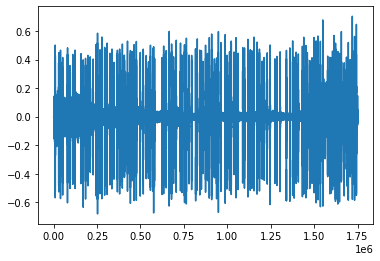

In [14]:
plt.plot(audio)

In [15]:
audio = tfio.audio.AudioIOTensor(file_path)
print(audio)

<AudioIOTensor: shape=[1752857       1], dtype=<dtype: 'float32'>, rate=32000>


In [66]:
audio_slice = audio[:32000]
audio_slice

<tf.Tensor: shape=(32000, 1), dtype=float32, numpy=
array([[-8.1090082e-05],
       [ 4.9273229e-05],
       [ 5.8783160e-05],
       ...,
       [ 2.2658786e-02],
       [ 2.0251524e-02],
       [ 2.6333148e-02]], dtype=float32)>

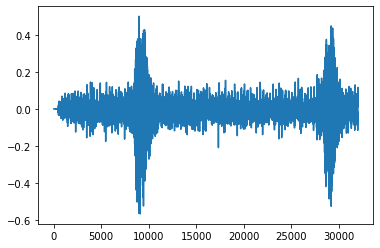

In [67]:
plt.plot(audio_slice.numpy())

In [68]:
audio.rate

<tf.Tensor: shape=(), dtype=int32, numpy=32000>

In [69]:
from IPython.display import Audio

In [70]:
audio_tensor = tf.squeeze(audio_slice, axis=[-1])

In [71]:
import numpy as np

In [98]:
tensor = tf.cast(audio_tensor, tf.float32)#  / 32768.0
np.max(tensor)

0.50125116

In [99]:
Audio(tensor.numpy(), rate=audio.rate.numpy())

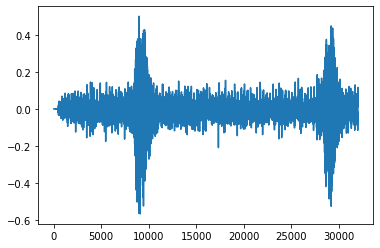

In [100]:
plt.plot(audio_slice.numpy())

In [101]:
print('One second of audio')
print('audio shape:', tensor.shape)
print('sample rate:', int(audio.rate))

One second of audio
audio shape: (32000,)
sample rate: 32000


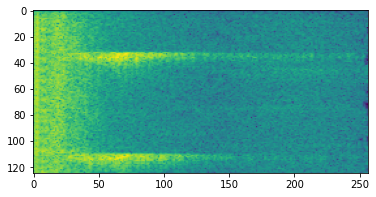

In [102]:
# Generate spectrogram with tensorflow-io
spectrogram = tfio.experimental.audio.spectrogram(tensor, 
                                                  nfft=512, 
                                                  window=512, 
                                                  stride=256)
plt.imshow(tf.math.log(spectrogram).numpy())

In [83]:
spectrogram.shape

TensorShape([125, 257])

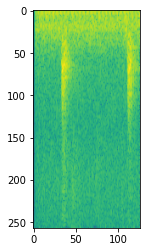

In [84]:
# Generate spectgrogram wtih librosa
fft_windows = librosa.stft(tensor.numpy(),
                           n_fft=512,
                           win_length=256, 
                           hop_length=256)
magnitude = np.abs(fft_windows)**2
plt.imshow(tf.math.log(magnitude).numpy())


In [85]:
magnitude.shape

(257, 126)

In [87]:
magnitude.T

array([[5.5601981e-06, 4.0723530e-06, 1.5046633e-06, ..., 8.8388944e-08,
        9.5098418e-09, 2.1491348e-10],
       [3.6354046e-05, 4.5983765e-05, 4.3500095e-05, ..., 4.4872736e-06,
        3.2084718e-06, 2.5082265e-06],
       [1.3678446e-01, 1.9747940e-01, 3.5070857e-01, ..., 1.5727102e-04,
        3.7609268e-05, 7.6554061e-06],
       ...,
       [2.4325353e-01, 5.3703779e-01, 7.2692549e-01, ..., 3.1878593e-04,
        8.2580678e-05, 2.5483228e-05],
       [1.9992369e+00, 2.3743398e+00, 3.0698974e+00, ..., 1.3104136e-04,
        7.6421326e-05, 5.4772852e-05],
       [1.1221628e-01, 1.6980303e-02, 1.4694189e+00, ..., 2.1701735e-04,
        6.7963364e-04, 9.1838208e-04]], dtype=float32)

In [88]:
spectrogram

<tf.Tensor: shape=(125, 257), dtype=float32, numpy=
array([[5.9387591e-03, 1.1059659e-02, 1.3532040e-02, ..., 3.8561020e-03,
        1.6501406e-03, 2.0465325e-04],
       [3.8051766e-01, 5.6012440e-01, 9.0074790e-01, ..., 1.0871236e-02,
        1.2867081e-02, 1.1339024e-02],
       [1.7788395e-01, 8.1527734e-01, 6.4518654e-01, ..., 1.1511155e-02,
        9.8573156e-03, 1.1115193e-02],
       ...,
       [3.2641786e-01, 2.5962155e+00, 2.0265257e+00, ..., 1.9925645e-02,
        9.6498290e-03, 2.2092909e-03],
       [1.6978260e-02, 1.8447858e+00, 2.6436613e+00, ..., 1.4999538e-02,
        7.4103079e-03, 3.8576610e-03],
       [1.4152956e+00, 1.6747288e+00, 1.9507060e+00, ..., 2.5080953e-02,
        3.1163933e-02, 3.3688068e-02]], dtype=float32)>

In [55]:
spectrogram.shape

TensorShape([79, 257])

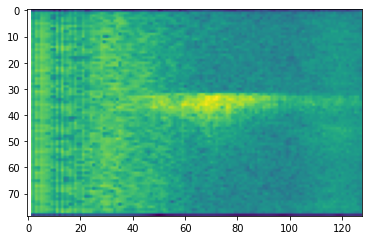

In [26]:
# convert to mel-spectrogram
mel_spectrogram = tfio.experimental.audio.melscale(
    spectrogram, rate=16000, mels=128, fmin=0, fmax=8000)

plt.imshow(tf.math.log(mel_spectrogram).numpy())

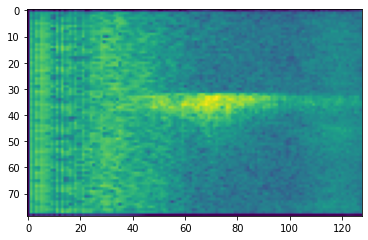

In [42]:
dbscale_mel_spectrogram = tfio.experimental.audio.dbscale(
    mel_spectrogram.numpy(), top_db=80)

plt.imshow(dbscale_mel_spectrogram.numpy())

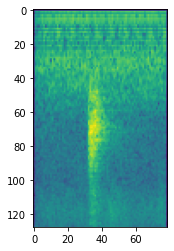

In [54]:
plt.imshow(tf.transpose(dbscale_mel_spectrogram.numpy()))

# Same melspec with librosa

In [40]:
import librosa

In [57]:
librosa_melspec = librosa.feature.melspectrogram(tensor.numpy(), 
                                                 sr=audio.rate, 
                                                 n_fft=512, 
                                                 win_length=512,
                                                 hop_length=256)

/Users/benbogart/opt/anaconda3/envs/audio-ml/lib/python3.8/site-packages/librosa/filters.py:238: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  warnings.warn(


In [56]:
librosa_melspec.shape

(128, 79)

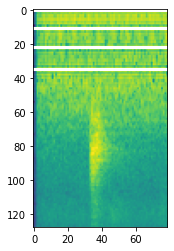

In [53]:
plt.imshow(tf.math.log(librosa_melspec).numpy())


hmm, those are not the same.  Step through the melspec creation.

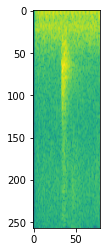

In [58]:
fft_windows = librosa.stft(tensor.numpy(), n_fft=512, win_length=256, hop_length=256)
magnitude = np.abs(fft_windows)**2
plt.imshow(tf.math.log(magnitude).numpy())


In [59]:
magnitude.shape

(257, 79)

In [ ]:
mel = librosa.filters.mel(sr=sr, n_fft=n_fft, n_mels=n_mels)

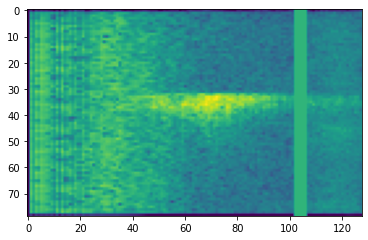

In [37]:
# frequency masking
freq_mask = tfio.experimental.audio.freq_mask(dbscale_mel_spectrogram, param=10)
plt.imshow(freq_mask.numpy())

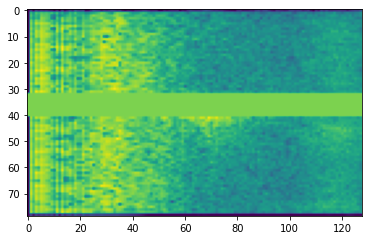

In [38]:
time_mask = tfio.experimental.audio.time_mask(dbscale_mel_spectrogram, param=10)
plt.imshow(time_mask.numpy())

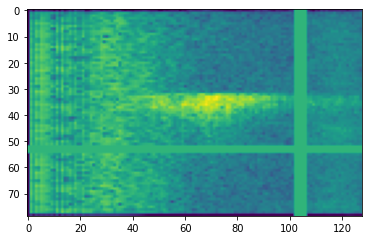

In [39]:
freq_time_mask = tfio.experimental.audio.time_mask(freq_mask, param=10)
plt.imshow(freq_time_mask.numpy())